In [1]:
import pandas as pd

data = pd.read_csv('merged_circle_finish3.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'merged_circle_finish3.csv'

In [6]:
data.head()

,Unnamed: 0,date,Rank,New_Artist,Title,Production,Runtime,Genre,Weekly Views,n_score,...,R&B,Classical,Ballad,Soul,Rock,Pop,season_autumn,season_spring,season_summer,season_winter
0,0,2023-09-24,1,악뮤,Love Lee,YG Entertainment,-0.733963,가요/댄스,2.119452,0.942971,...,0,0,0,0,0,0,1,0,0,0
1,1,2023-09-24,2,악뮤,후라이의 꿈,YG Entertainment,-0.077307,가요/블루스/포크,2.119452,0.942971,...,0,0,0,0,0,0,1,0,0,0
2,2,2023-09-24,4,뉴진스,Super Shy,ADOR,-1.390619,가요/댄스,2.047278,0.101924,...,0,0,0,0,0,0,1,0,0,0
3,3,2023-09-24,5,정국,Seven (feat. Latto) - Clean Ver.,BIGHIT MUSIC,-0.628898,가요/댄스,0.083618,0.613535,...,0,0,0,0,0,0,1,0,0,0
4,4,2023-09-24,6,뉴진스,ETA,ADOR,-1.495684,가요/댄스,2.047278,0.101924,...,0,0,0,0,0,0,1,0,0,0


In [7]:
data.columns

Index(['Unnamed: 0', 'date', 'Rank', 'New_Artist', 'Title', 'Production',
       'Runtime', 'Genre', 'Weekly Views', 'n_score', 'g_score', 'ky_chart_on',
       'Genre_split', 'KoreanMovies', 'Dance', 'Indie', 'Trot', 'J-POP',
       'Electronica', 'Drama', 'All', 'Rap', 'Traditional',
       'OriginalSoundtrack', 'Jazz', 'Folk', 'K-Pop', 'Hip-Hop', 'Blues',
       'Crossover', 'R&B', 'Classical', 'Ballad', 'Soul', 'Rock', 'Pop',
       'season_autumn', 'season_spring', 'season_summer', 'season_winter'],
      dtype='object')

In [35]:
import pydot
import pandas as pd
from sklearn.model_selection import train_test_split

X = pd.read_csv('X_data.csv', index_col=0)
y = pd.read_csv('y_data.csv', index_col=0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=62, shuffle=False)

In [36]:
from sklearn.tree import DecisionTreeRegressor

tree = DecisionTreeRegressor()
tree.fit(X_train, y_train)

DecisionTreeRegressor()

In [14]:
from sklearn.tree import export_graphviz

export_graphviz(tree, out_file='tree.dot', impurity = False, filled = True)

In [11]:
import graphviz

with open('tree.dot') as o :
    dot_graph = o.read()

graphviz.Source(dot_graph)

In [37]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# 평가 지표 계산 함수
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    return rmse, r2, y_pred

In [38]:
# 모델 학습 및 평가
results = {}

tree.fit(X_train, y_train)
rmse, r2, y_pred = evaluate_model(tree, X_test, y_test)
print( 'RMSE:', rmse, 'R²:', r2 )

RMSE: 26.417651885293562 R²: 0.7965751148399254


In [39]:
y_test = y_test.reset_index(drop=True)

In [40]:
y_pred

array([173., 189.,  91., ..., 182., 195.,  21.])

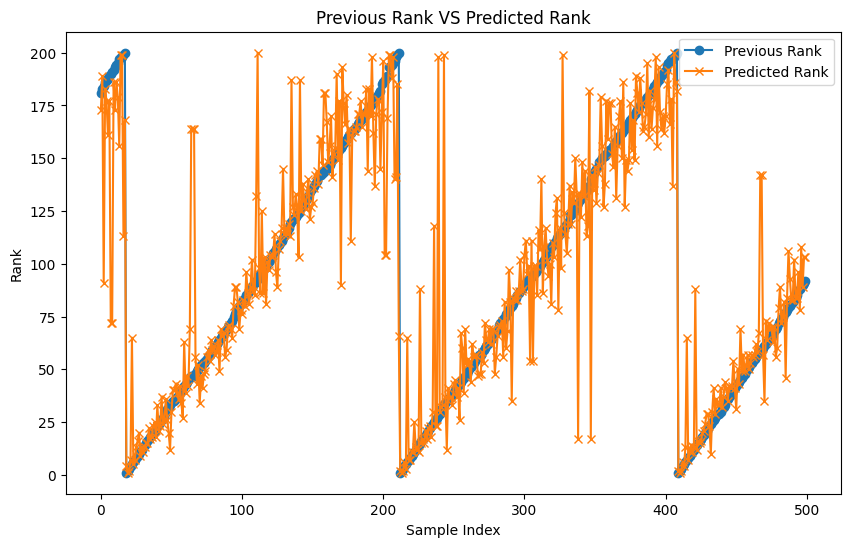

In [43]:
import matplotlib.pyplot as plt

# 모델 예측값과 실제값 비교 그래프
plt.figure(figsize=(10, 6))
plt.plot(y_test[:500], label='Previous Rank', marker='o')
plt.plot(pd.DataFrame(y_pred[:500]), label='Predicted Rank', marker='x') # 예측값은 numpy 배열이라서 데이터프레임화 해줘야 제대로 나옴
plt.xlabel('Sample Index')
plt.ylabel('Rank')
plt.title('Previous Rank VS Predicted Rank')
plt.legend()
plt.show()